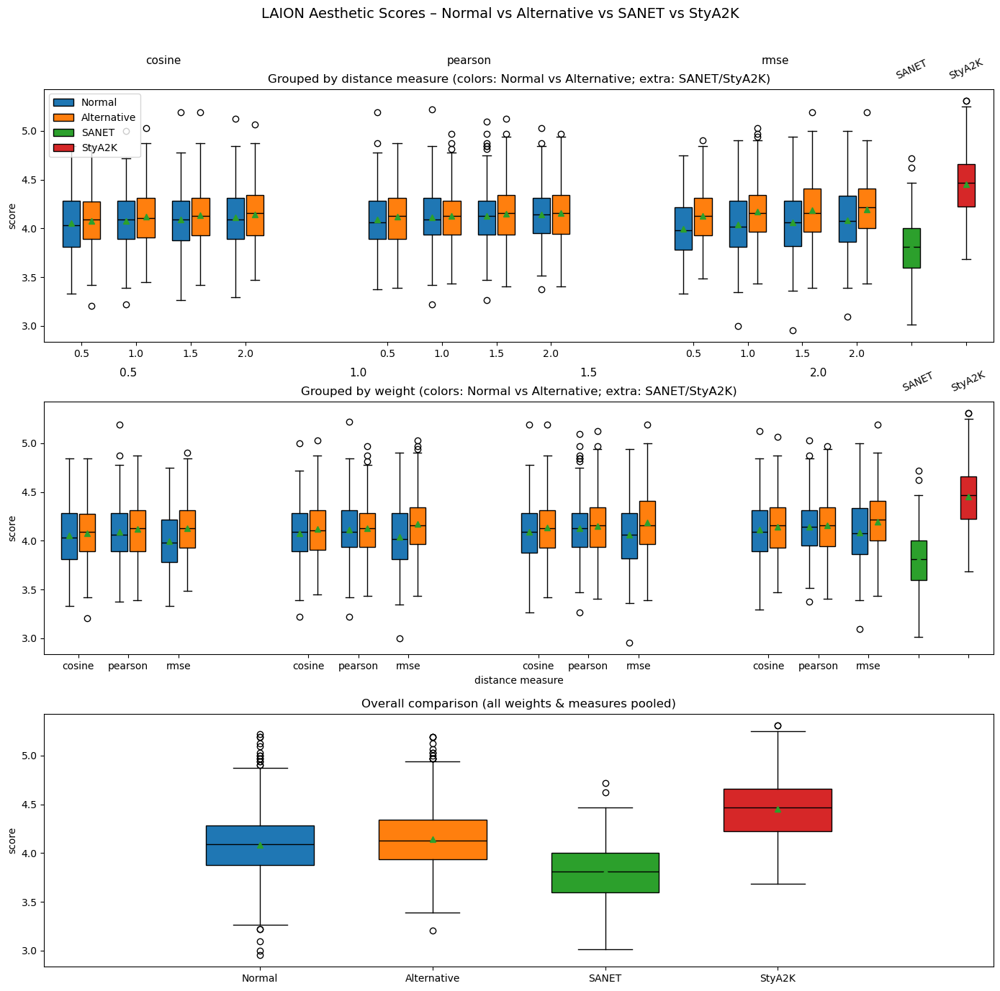

In [ ]:
import json, numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.patches import Patch

# ----------- Config -----------


paths_norm = [
    "laion_scores/laion_scores_style_loss_0_5.json",
    "laion_scores/laion_scores_style_loss_1.json",
    "laion_scores/laion_scores_style_loss_1_5.json",
    "laion_scores/laion_scores_style_loss_2.json",
]
paths_alt = [
    "laion_scores_alt/laion_scores_style_loss_0_5.json",
    "laion_scores_alt/laion_scores_style_loss_1.json",
    "laion_scores_alt/laion_scores_style_loss_1_5.json",
    "laion_scores_alt/laion_scores_style_loss_2.json",
]

sanet_path  = "laion_scores_SANET.json"
stya2k_path = "laion_scores_StyA2K.json"

weights = [0.5, 1.0, 1.5, 2.0]
metrics = ["cosine", "pearson", "rmse"]

color_norm   = "tab:blue"
color_alt    = "tab:orange"
color_sanet  = "tab:green"
color_stya2k = "tab:red"

# ----------- Utils -----------
def to_1d_array(v):
    if isinstance(v, dict):
        v = list(v.values())
    return np.asarray(v, dtype=float).ravel()

def load_by_metric(paths):
    out = {m: [] for m in metrics}
    for p in paths:
        with open(p, "r") as f:
            d = json.load(f)
        if all(k in d for k in metrics):     # shape A: {metric: list/dict}
            for m in metrics:
                out[m].append(to_1d_array(d[m]))
        else:                                 # shape B: {id: {metric: value}} OR {id: value}
            for m in metrics:
                # if leaf is number, take it; if dict, take dict[m]
                vals = []
                for k, v in d.items():
                    if isinstance(v, dict):
                        vals.append(v[m])
                    else:
                        vals.append(v)
                out[m].append(np.asarray(vals, dtype=float))
    return out  # dict(metric)->list[w_idx]->np.array

def to_by_weight(by_metric_dict):
    return [[by_metric_dict[m][wi] for m in metrics] for wi in range(len(weights))]

def flatten_all(by_metric_dict):
    return np.concatenate([arr for m in metrics for arr in by_metric_dict[m]])

def load_flat_scores(path_like):
    with open(path_like, "r") as f:
        d = json.load(f)
    return to_1d_array(d)

# ----------- Load -----------
by_metric_norm = load_by_metric(paths_norm)
by_metric_alt  = load_by_metric(paths_alt)

by_weight_norm = to_by_weight(by_metric_norm)
by_weight_alt  = to_by_weight(by_metric_alt)

all_norm = flatten_all(by_metric_norm)
all_alt  = flatten_all(by_metric_alt)

# NEW: method-only distributions
scores_sanet  = load_flat_scores(sanet_path)
scores_stya2k = load_flat_scores(stya2k_path)

# ----------- Plot -----------
fig, axes = plt.subplots(3, 1, figsize=(14, 14), sharey=False)

legend_handles = [
    Patch(facecolor=color_norm,   edgecolor="black", label="Normal"),
    Patch(facecolor=color_alt,    edgecolor="black", label="Alternative"),
    Patch(facecolor=color_sanet,  edgecolor="black", label="SANET"),
    Patch(facecolor=color_stya2k, edgecolor="black", label="StyA2K"),
]

# ========== SUBPLOT 1: Grouped by measure ==========
ax = axes[0]
pair_spacing = 1.0
group_gap = 1.6
group_width = len(weights)*pair_spacing + group_gap

for mi, m in enumerate(metrics):
    base = mi * group_width
    centers = [base + j*pair_spacing for j in range(len(weights))]
    pos_norm = [c - 0.18 for c in centers]
    pos_alt  = [c + 0.18 for c in centers]

    bp1 = ax.boxplot(by_metric_norm[m], positions=pos_norm, widths=0.32,
                     showmeans=True, patch_artist=True)
    bp2 = ax.boxplot(by_metric_alt[m],  positions=pos_alt,  widths=0.32,
                     showmeans=True, patch_artist=True)

    for b in bp1['boxes']: b.set_facecolor(color_norm)
    for b in bp2['boxes']: b.set_facecolor(color_alt)
    for key in ('means','medians'):
        for ln in bp1[key]: ln.set_color("black")
        for ln in bp2[key]: ln.set_color("black")

# tick label: pesi ripetuti per ogni metrica
tick_positions = []
tick_labels = []
for mi in range(len(metrics)):
    base = mi * group_width
    centers = [base + j*pair_spacing for j in range(len(weights))]
    tick_positions.extend(centers)
    tick_labels.extend([str(w) for w in weights])

# --- extra boxes a destra (SANET/StyA2K) ---
dx_extra = 1.0  # più spazio per evitare overlap
x_right_base = (tick_positions[-1] if tick_positions else 0) + dx_extra
pos_sanet_1  = x_right_base
pos_sty_1    = x_right_base + dx_extra

bp_sanet = ax.boxplot([scores_sanet],  positions=[pos_sanet_1], widths=0.32,
                      showmeans=True, patch_artist=True)
bp_sty   = ax.boxplot([scores_stya2k], positions=[pos_sty_1],  widths=0.32,
                      showmeans=True, patch_artist=True)
for b in bp_sanet['boxes']: b.set_facecolor(color_sanet)
for b in bp_sty['boxes']:   b.set_facecolor(color_stya2k)
for key in ('means','medians'):
    for ln in bp_sanet[key]: ln.set_color("black")
    for ln in bp_sty[key]:   ln.set_color("black")

# etichette sopra le extra box (no overlap)
y0, y1 = ax.get_ylim()
dy = (y1 - y0)
ax.text(pos_sanet_1, y1 + 0.03*dy, "SANET",  ha="center", va="bottom", rotation=25, clip_on=False)
ax.text(pos_sty_1,   y1 + 0.03*dy, "StyA2K", ha="center", va="bottom", rotation=25, clip_on=False)

# fisso i tick DOPO aver aggiunto le extra box (gli ultimi due sono vuoti)
ax.set_xticks(tick_positions + [pos_sanet_1, pos_sty_1])
ax.set_xticklabels(tick_labels + ["", ""])
ax.set_ylabel("score")
ax.set_title("Grouped by distance measure (colors: Normal vs Alternative; extra: SANET/StyA2K)")
ax.legend(handles=legend_handles, loc="upper left")

# metrica sopra ogni gruppo (niente linee grigie)
for mi, m in enumerate(metrics):
    left  = mi * group_width
    right = left + (len(weights)-1)*pair_spacing
    center = (left + right) / 2
    ax.text(center, y1 + 0.09*dy, m, ha="center", va="bottom", fontsize=11, clip_on=False)

# ========== SUBPLOT 2: Grouped by weight ==========
ax = axes[1]
pair_spacing = 1.0
group_gap = 1.6
group_width = len(metrics)*pair_spacing + group_gap

for wi, w in enumerate(weights):
    base = wi * group_width
    centers = [base + j*pair_spacing for j in range(len(metrics))]
    pos_norm = [c - 0.18 for c in centers]
    pos_alt  = [c + 0.18 for c in centers]
    data_norm = [by_weight_norm[wi][mi] for mi in range(len(metrics))]
    data_alt  = [by_weight_alt[wi][mi]  for mi in range(len(metrics))]

    bp1 = ax.boxplot(data_norm, positions=pos_norm, widths=0.32,
                     showmeans=True, patch_artist=True)
    bp2 = ax.boxplot(data_alt,  positions=pos_alt,  widths=0.32,
                     showmeans=True, patch_artist=True)
    for b in bp1['boxes']: b.set_facecolor(color_norm)
    for b in bp2['boxes']: b.set_facecolor(color_alt)
    for key in ('means','medians'):
        for ln in bp1[key]: ln.set_color("black")
        for ln in bp2[key]: ln.set_color("black")

# tick label: metriche ripetute per ogni peso
tick_positions = []
tick_labels = []
for wi in range(len(weights)):
    base = wi * group_width
    centers = [base + j*pair_spacing for j in range(len(metrics))]
    tick_positions.extend(centers)
    tick_labels.extend(metrics)

# extra a destra (SANET/StyA2K)
x_right_base = (tick_positions[-1] if tick_positions else 0) + dx_extra
pos_sanet_2  = x_right_base
pos_sty_2    = x_right_base + dx_extra

bp_sanet = ax.boxplot([scores_sanet],  positions=[pos_sanet_2], widths=0.32,
                      showmeans=True, patch_artist=True)
bp_sty   = ax.boxplot([scores_stya2k], positions=[pos_sty_2],  widths=0.32,
                      showmeans=True, patch_artist=True)
for b in bp_sanet['boxes']: b.set_facecolor(color_sanet)
for b in bp_sty['boxes']:   b.set_facecolor(color_stya2k)
for key in ('means','medians'):
    for ln in bp_sanet[key]: ln.set_color("black")
    for ln in bp_sty[key]:   ln.set_color("black")

y0, y1 = ax.get_ylim(); dy = (y1 - y0)
ax.text(pos_sanet_2, y1 + 0.03*dy, "SANET",  ha="center", va="bottom", rotation=25, clip_on=False)
ax.text(pos_sty_2,   y1 + 0.03*dy, "StyA2K", ha="center", va="bottom", rotation=25, clip_on=False)

# fisso i tick (ultimi due vuoti)
ax.set_xticks(tick_positions + [pos_sanet_2, pos_sty_2])
ax.set_xticklabels(tick_labels + ["", ""])
ax.set_xlabel("distance measure")
ax.set_ylabel("score")
ax.set_title("Grouped by weight (colors: Normal vs Alternative; extra: SANET/StyA2K)")

# peso sopra ogni gruppo
for wi, w in enumerate(weights):
    left  = wi * group_width
    right = left + (len(metrics)-1)*pair_spacing
    center = (left + right) / 2
    ax.text(center, y1 + 0.09*dy, str(w), ha="center", va="bottom", fontsize=11, clip_on=False)

# ========== SUBPLOT 3: Overall ==========
ax = axes[2]
positions = [0.8, 1.2, 1.6, 2.0]
labels    = ["Normal", "Alternative", "SANET", "StyA2K"]
data      = [all_norm, all_alt, scores_sanet, scores_stya2k]
colors    = [color_norm, color_alt, color_sanet, color_stya2k]

for x, d, c in zip(positions, data, colors):
    bp = ax.boxplot([d], positions=[x], widths=0.25, showmeans=True, patch_artist=True)
    for b in bp['boxes']: b.set_facecolor(c)
    for key in ('means','medians'):
        for ln in bp[key]: ln.set_color("black")

ax.set_xticks(positions)
ax.set_xticklabels(labels)
ax.set_ylabel("score")
ax.set_title("Overall comparison (all weights & measures pooled)")

fig.suptitle("LAION Aesthetic Scores – Normal vs Alternative vs SANET vs StyA2K", fontsize=14, y=0.98)
plt.tight_layout(rect=(0, 0, 1, 0.965))
plt.show()


In [ ]:
import json, numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.patches import Patch

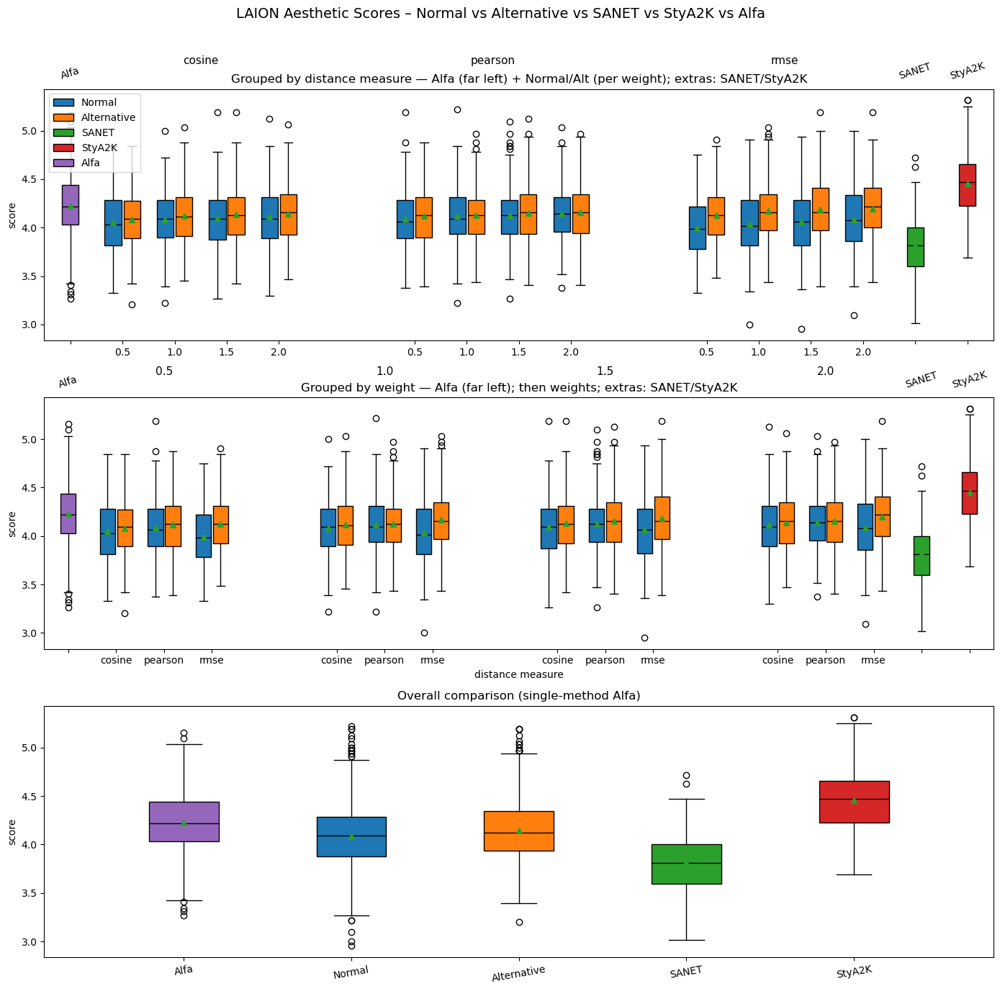

In [12]:
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ----------- Config -----------

paths_norm = [
    "laion_scores/laion_scores_style_loss_0_5.json",
    "laion_scores/laion_scores_style_loss_1.json",
    "laion_scores/laion_scores_style_loss_1_5.json",
    "laion_scores/laion_scores_style_loss_2.json",
]
paths_alt = [
    "laion_scores_alt/laion_scores_style_loss_0_5.json",
    "laion_scores_alt/laion_scores_style_loss_1.json",
    "laion_scores_alt/laion_scores_style_loss_1_5.json",
    "laion_scores_alt/laion_scores_style_loss_2.json",
]

sanet_path   = "laion_scores_SANET.json"
stya2k_path  = "laion_scores_StyA2K.json"
alfa_path    = "laion_scores_alfa/laion_scores_alfa.json"

weights = [0.5, 1.0, 1.5, 2.0]
metrics = ["cosine", "pearson", "rmse"]

color_norm   = "tab:blue"
color_alt    = "tab:orange"
color_sanet  = "tab:green"
color_stya2k = "tab:red"
color_alfa   = "tab:purple"

# ----------- Utils -----------

def to_1d_array(v):
    """Flattens list/dict of numerics to a 1D float array."""
    if isinstance(v, dict):
        v = list(v.values())
    return np.asarray(v, dtype=float).ravel()

def load_by_metric(paths):
    """
    Returns dict(metric)->list[w_idx]->np.array
    Supports:
      - shape A: {metric: list/dict of values}
      - shape B: {id: {metric: value}} OR {id: value}
    """
    out = {m: [] for m in metrics}
    for p in paths:
        with open(p, "r") as f:
            d = json.load(f)
        if isinstance(d, dict) and all(k in d for k in metrics):
            # shape A
            for m in metrics:
                out[m].append(to_1d_array(d[m]))
        else:
            # shape B
            for m in metrics:
                vals = []
                if isinstance(d, dict):
                    for _, v in d.items():
                        if isinstance(v, dict):
                            vals.append(v[m])
                        else:
                            vals.append(v)
                else:
                    vals = d  # assume list-like
                out[m].append(np.asarray(vals, dtype=float))
    return out

def to_by_weight(by_metric_dict):
    """Reindex to [w_idx][metric_idx] arrays."""
    return [[by_metric_dict[m][wi] for m in metrics] for wi in range(len(weights))]

def flatten_all(by_metric_dict):
    """Concatenate all arrays across metrics and weights."""
    return np.concatenate([arr for m in metrics for arr in by_metric_dict[m]])

def load_flat_scores(path_like, key=None):
    """
    Load a single-method distribution from JSON.
    Accepts:
      - list of numbers
      - dict of id->number
      - dict of id->{...} and picks:
          * specific 'key' if provided (e.g., 'alfa')
          * else the first numeric value found
    """
    with open(path_like, "r") as f:
        d = json.load(f)

    if isinstance(d, list):
        return np.asarray(d, dtype=float)

    if isinstance(d, dict):
        vals = []
        for v in d.values():
            if isinstance(v, (int, float)) and not isinstance(v, bool):
                vals.append(v)
            elif isinstance(v, dict):
                if key is not None and key in v and v[key] is not None:
                    vals.append(v[key])
                else:
                    # fallback: first numeric field
                    picked = None
                    for vv in v.values():
                        if isinstance(vv, (int, float)) and not isinstance(vv, bool):
                            picked = vv
                            break
                    if picked is not None:
                        vals.append(picked)
        return np.asarray(vals, dtype=float)

    # fallback
    return np.asarray([d], dtype=float)

# ----------- Load -----------

by_metric_norm = load_by_metric(paths_norm)
by_metric_alt  = load_by_metric(paths_alt)

by_weight_norm = to_by_weight(by_metric_norm)
by_weight_alt  = to_by_weight(by_metric_alt)

all_norm = flatten_all(by_metric_norm)
all_alt  = flatten_all(by_metric_alt)

# Method-only distributions
scores_sanet   = load_flat_scores(sanet_path)
scores_stya2k  = load_flat_scores(stya2k_path)
alfa_scores    = load_flat_scores(alfa_path, key="alfa")  # Alfa is a single method

# ----------- Plot -----------

fig, axes = plt.subplots(3, 1, figsize=(14, 14), sharey=False)

legend_handles = [
    Patch(facecolor=color_norm,   edgecolor="black", label="Normal"),
    Patch(facecolor=color_alt,    edgecolor="black", label="Alternative"),
    Patch(facecolor=color_sanet,  edgecolor="black", label="SANET"),
    Patch(facecolor=color_stya2k, edgecolor="black", label="StyA2K"),
    Patch(facecolor=color_alfa,   edgecolor="black", label="Alfa"),
]

dx_extra = 1.0  # spacing for single-method boxes (SANET/StyA2K/Alfa)

# ========== SUBPLOT 1: Grouped by distance measure ==========
ax = axes[0]
pair_spacing = 1.0
group_gap    = 1.6
group_width  = len(weights) * pair_spacing + group_gap

tick_positions = []
tick_labels    = []

for mi, m in enumerate(metrics):
    base = mi * group_width
    centers = [base + j * pair_spacing for j in range(len(weights))]
    pos_norm = [c - 0.18 for c in centers]
    pos_alt  = [c + 0.18 for c in centers]

    bp1 = ax.boxplot(by_metric_norm[m], positions=pos_norm, widths=0.32,
                     showmeans=True, patch_artist=True)
    bp2 = ax.boxplot(by_metric_alt[m],  positions=pos_alt,  widths=0.32,
                     showmeans=True, patch_artist=True)
    for b in bp1['boxes']: b.set_facecolor(color_norm)
    for b in bp2['boxes']: b.set_facecolor(color_alt)
    for key in ('means', 'medians'):
        for ln in bp1[key]: ln.set_color("black")
        for ln in bp2[key]: ln.set_color("black")

    tick_positions.extend(centers)
    tick_labels.extend([str(w) for w in weights])

# extra single-method boxes: Alfa at far left, SANET/StyA2K on the right
x_right_base = (tick_positions[-1] if tick_positions else 0) + dx_extra
pos_sanet_1  = x_right_base
pos_sty_1    = x_right_base + dx_extra
pos_alfa_1   = -dx_extra  # far left

for x, data, col in [(pos_alfa_1, alfa_scores,   color_alfa),
                     (pos_sanet_1, scores_sanet, color_sanet),
                     (pos_sty_1,   scores_stya2k, color_stya2k)]:
    bp = ax.boxplot([data], positions=[x], widths=0.32, showmeans=True, patch_artist=True)
    for b in bp['boxes']: b.set_facecolor(col)
    for ln in bp['means'] + bp['medians']: ln.set_color("black")

# labels above groups/extras
y0, y1 = ax.get_ylim(); dy = (y1 - y0)
ax.text(pos_alfa_1,  y1 + 0.03*dy, "Alfa",   ha="center", va="bottom", rotation=18, clip_on=False)
ax.text(pos_sanet_1, y1 + 0.03*dy, "SANET",  ha="center", va="bottom", rotation=18, clip_on=False)
ax.text(pos_sty_1,   y1 + 0.03*dy, "StyA2K", ha="center", va="bottom", rotation=18, clip_on=False)

for mi, m in enumerate(metrics):
    left   = mi * group_width
    right  = mi * group_width + (len(weights) - 1) * pair_spacing
    center = (left + right) / 2
    ax.text(center, y1 + 0.09*dy, m, ha="center", va="bottom", fontsize=11, clip_on=False)

ax.set_xticks(tick_positions + [pos_alfa_1, pos_sanet_1, pos_sty_1])
ax.set_xticklabels(tick_labels + ["", "", ""])
ax.set_ylabel("score")
ax.set_title("Grouped by distance measure — Alfa (far left) + Normal/Alt (per weight); extras: SANET/StyA2K")
ax.legend(handles=legend_handles, loc="upper left")

# ========== SUBPLOT 2: Grouped by weight ==========
ax = axes[1]
pair_spacing = 1.0
group_gap    = 1.6
group_width  = len(metrics) * pair_spacing + group_gap

tick_positions = []
tick_labels    = []

# Alfa: single box at far left
pos_alfa_2 = -dx_extra
bpA = ax.boxplot([alfa_scores], positions=[pos_alfa_2], widths=0.32,
                 showmeans=True, patch_artist=True)
for b in bpA['boxes']: b.set_facecolor(color_alfa)
for ln in bpA['means'] + bpA['medians']: ln.set_color("black")

# groups for each weight (metrics on x-axis inside each group)
for wi, w in enumerate(weights):
    base = wi * group_width
    centers = [base + j * pair_spacing for j in range(len(metrics))]
    pos_norm = [c - 0.18 for c in centers]
    pos_alt  = [c + 0.18 for c in centers]

    data_norm = [by_weight_norm[wi][mi] for mi in range(len(metrics))]
    data_alt  = [by_weight_alt[wi][mi]  for mi in range(len(metrics))]

    bp1 = ax.boxplot(data_norm, positions=pos_norm, widths=0.32,
                     showmeans=True, patch_artist=True)
    bp2 = ax.boxplot(data_alt,  positions=pos_alt,  widths=0.32,
                     showmeans=True, patch_artist=True)
    for b in bp1['boxes']: b.set_facecolor(color_norm)
    for b in bp2['boxes']: b.set_facecolor(color_alt)
    for key in ('means', 'medians'):
        for ln in bp1[key]: ln.set_color("black")
        for ln in bp2[key]: ln.set_color("black")

    tick_positions.extend(centers)
    tick_labels.extend(metrics)

# SANET/StyA2K on the right
x_right_base = (tick_positions[-1] if tick_positions else 0) + dx_extra
pos_sanet_2  = x_right_base
pos_sty_2    = x_right_base + dx_extra

for x, data, col in [(pos_sanet_2, scores_sanet,  color_sanet),
                     (pos_sty_2,   scores_stya2k, color_stya2k)]:
    bp = ax.boxplot([data], positions=[x], widths=0.32, showmeans=True, patch_artist=True)
    for b in bp['boxes']: b.set_facecolor(col)
    for ln in bp['means'] + bp['medians']: ln.set_color("black")

# labels above extras and weight group headings
y0, y1 = ax.get_ylim(); dy = (y1 - y0)
ax.text(pos_alfa_2,  y1 + 0.03*dy, "Alfa",   ha="center", va="bottom", rotation=18, clip_on=False)
ax.text(pos_sanet_2, y1 + 0.03*dy, "SANET",  ha="center", va="bottom", rotation=18, clip_on=False)
ax.text(pos_sty_2,   y1 + 0.03*dy, "StyA2K", ha="center", va="bottom", rotation=18, clip_on=False)

for wi, w in enumerate(weights):
    left   = wi * group_width
    right  = left + (len(metrics) - 1) * pair_spacing
    center = (left + right) / 2
    ax.text(center, y1 + 0.08*dy, str(w), ha="center", va="bottom", fontsize=11, clip_on=False)

ax.set_xticks(tick_positions + [pos_alfa_2, pos_sanet_2, pos_sty_2])
ax.set_xticklabels(tick_labels + ["", "", ""])
ax.set_xlabel("distance measure")
ax.set_ylabel("score")
ax.set_title("Grouped by weight — Alfa (far left); then weights; extras: SANET/StyA2K")

# ========== SUBPLOT 3: Overall ==========
ax = axes[2]
positions = [0.6, 1.2, 1.8, 2.4, 3.0]
labels    = ["Alfa", "Normal", "Alternative", "SANET", "StyA2K"]
data      = [alfa_scores, all_norm, all_alt, scores_sanet, scores_stya2k]
colors    = [color_alfa,  color_norm, color_alt, color_sanet, color_stya2k]

for x, d, c in zip(positions, data, colors):
    bp = ax.boxplot([d], positions=[x], widths=0.25, showmeans=True, patch_artist=True)
    for b in bp['boxes']: b.set_facecolor(c)
    for ln in bp['means'] + bp['medians']: ln.set_color("black")

ax.set_xticks(positions)
ax.set_xticklabels(labels, rotation=10)
ax.set_ylabel("score")
ax.set_title("Overall comparison (single-method Alfa)")

fig.suptitle("LAION Aesthetic Scores – Normal vs Alternative vs SANET vs StyA2K vs Alfa", fontsize=14, y=0.98)
plt.tight_layout(rect=(0, 0, 1, 0.965))
plt.show()


{'Abstract_Expressionism_0_Tuebingens': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4.34375}, 'Abstract_Expressionism_0_baseball-bat': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 3.921875}, 'Abstract_Expressionism_0_bear': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4.3125}, 'Abstract_Expressionism_0_bus': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4.21875}, 'Abstract_Expressionism_0_carrot': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 3.859375}, 'Abstract_Expressionism_0_chicago': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4.40625}, 'Abstract_Expressionism_0_cow': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 3.859375}, 'Abstract_Expressionism_0_cup': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4.21875}, 'Abstract_Expressionism_0_spoon': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4.6875}, 'Abstract_Expressionism_0_vase': {'cosine': None, 'pearson': None, 'rmse': None, 'alfa': 4

In [15]:
from scipy.stats import wilcoxon, rankdata
import pandas as pd

path_alfa = "laion_scores_full_experiment_preliminary_results.json"

paths_norm = [
    "laion_scores/laion_scores_style_loss_0_5.json",
    "laion_scores/laion_scores_style_loss_1.json",
    "laion_scores/laion_scores_style_loss_1_5.json",
    "laion_scores/laion_scores_style_loss_2.json",
]
paths_alt = [
    "laion_scores_alt/laion_scores_style_loss_0_5.json",
    "laion_scores_alt/laion_scores_style_loss_1.json",
    "laion_scores_alt/laion_scores_style_loss_1_5.json",
    "laion_scores_alt/laion_scores_style_loss_2.json",
]

path_alfa = "laion_scores_alfa/laion_scores_alfa.json"

sanet_path  = "laion_scores_SANET.json"
stya2k_path = "laion_scores_StyA2K.json"

def extract_metric_from_dict(file_path):
    with open(file_path, "r") as f:
        data = json.load(f)
        return [(img_name, img_scores) for img_name, img_scores in data.items()]

def extract_metric(metric, file_path, name = False):
    with open(file_path, "r") as f:
        data = json.load(f)
        if not name:
            scores = np.array([], dtype=float)
            for img_name in data:
                img_scores = data[img_name]
                scores = np.append(scores, img_scores[metric])
        else:
            scores = list()
            for img_name in data:
                img_scores = data[img_name]
                scores.append((img_name, img_scores[metric]))

    return scores

def extract_metric_alfa(file_path):
    with open(file_path, "r") as f:
        data = json.load(f)
        

methods_scores = {
    "Alfa": extract_metric("alfa", path_alfa),
    "SANET": load_flat_scores(sanet_path),
    "StyA2K": load_flat_scores(stya2k_path),
    "Normal_0_5_cosine": extract_metric("cosine", paths_norm[0]),
    "Normal_1_cosine": extract_metric("cosine", paths_norm[1]),
    "Normal_1_5_cosine": extract_metric("cosine", paths_norm[2]),
    "Normal_2_cosine": extract_metric("cosine", paths_norm[3]),
    "Normal_0_5_pearson": extract_metric("pearson", paths_norm[0]),
    "Normal_1_pearson": extract_metric("pearson", paths_norm[1]),
    "Normal_1_5_pearson": extract_metric("pearson", paths_norm[2]),
    "Normal_2_pearson": extract_metric("pearson", paths_norm[3]),
    "Normal_0_5_rmse": extract_metric("rmse", paths_norm[0]),
    "Normal_1_rmse": extract_metric("rmse", paths_norm[1]),
    "Normal_1_5_rmse": extract_metric("rmse", paths_norm[2]),
    "Normal_2_rmse": extract_metric("rmse", paths_norm[3]),
    "Alternative_0_5_cosine": extract_metric("cosine", paths_alt[0]),
    "Alternative_1_cosine": extract_metric("cosine", paths_alt[1]),
    "Alternative_1_5_cosine": extract_metric("cosine", paths_alt[2]),
    "Alternative_2_cosine": extract_metric("cosine", paths_alt[3]),
    "Alternative_0_5_pearson": extract_metric("pearson", paths_alt[0]),
    "Alternative_1_pearson": extract_metric("pearson", paths_alt[1]),
    "Alternative_1_5_pearson": extract_metric("pearson", paths_alt[2]),
    "Alternative_2_pearson": extract_metric("pearson", paths_alt[3]),
    "Alternative_0_5_rmse": extract_metric("rmse", paths_alt[0]),
    "Alternative_1_rmse": extract_metric("rmse", paths_alt[1]),
    "Alternative_1_5_rmse": extract_metric("rmse", paths_alt[2]),
    "Alternative_2_rmse": extract_metric("rmse", paths_alt[3]),
}

methods_imgname_scores = {
    "Alfa": extract_metric("alfa", path_alfa, name=True),
    "SANET": extract_metric_from_dict(sanet_path),
    "StyA2K": extract_metric_from_dict(stya2k_path),
    "Normal_0_5_cosine": extract_metric("cosine", paths_norm[0], name=True),
    "Normal_1_cosine": extract_metric("cosine", paths_norm[1], name=True),
    "Normal_1_5_cosine": extract_metric("cosine", paths_norm[2], name=True),
    "Normal_2_cosine": extract_metric("cosine", paths_norm[3], name=True),
    "Normal_0_5_pearson": extract_metric("pearson", paths_norm[0], name=True),
    "Normal_1_pearson": extract_metric("pearson", paths_norm[1], name=True),
    "Normal_1_5_pearson": extract_metric("pearson", paths_norm[2], name=True),
    "Normal_2_pearson": extract_metric("pearson", paths_norm[3], name=True),
    "Normal_0_5_rmse": extract_metric("rmse", paths_norm[0], name=True),
    "Normal_1_rmse": extract_metric("rmse", paths_norm[1], name=True),
    "Normal_1_5_rmse": extract_metric("rmse", paths_norm[2], name=True),
    "Normal_2_rmse": extract_metric("rmse", paths_norm[3], name=True),
    "Alternative_0_5_cosine": extract_metric("cosine", paths_alt[0], name=True),
    "Alternative_1_cosine": extract_metric("cosine", paths_alt[1], name=True),
    "Alternative_1_5_cosine": extract_metric("cosine", paths_alt[2], name=True),
    "Alternative_2_cosine": extract_metric("cosine", paths_alt[3], name=True),
    "Alternative_0_5_pearson": extract_metric("pearson", paths_alt[0], name=True),
    "Alternative_1_pearson": extract_metric("pearson", paths_alt[1], name=True),
    "Alternative_1_5_pearson": extract_metric("pearson", paths_alt[2], name=True),
    "Alternative_2_pearson": extract_metric("pearson", paths_alt[3], name=True),
    "Alternative_0_5_rmse": extract_metric("rmse", paths_alt[0], name=True),
    "Alternative_1_rmse": extract_metric("rmse", paths_alt[1], name=True),
    "Alternative_1_5_rmse": extract_metric("rmse", paths_alt[2], name=True),
    "Alternative_2_rmse": extract_metric("rmse", paths_alt[3], name=True),
}


def pairwise_wilcoxon(x, y):
    x = np.asarray(x, float).ravel()
    y = np.asarray(y, float).ravel()
    n = min(x.size, y.size)
    x, y = x[:n], y[:n]
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    d = x - y
    nz = d != 0
    x, y, d = x[nz], y[nz], d[nz]
    if d.size == 0:
        return np.nan, np.nan, np.nan, 0
    stat, p = wilcoxon(x, y, zero_method='wilcox', alternative='two-sided')
    ranks = rankdata(np.abs(d), method='average')
    Wp = ranks[d > 0].sum()
    Wm = ranks[d < 0].sum()
    r_rb = (Wp - Wm) / ranks.sum()
    return stat, p, r_rb, d.size

p_value_matrix = pd.DataFrame(index=methods_scores.keys(), columns=methods_scores.keys(), dtype=float)

for i, method_1 in enumerate(methods_scores):
    for j, method_2 in enumerate(methods_scores):
        stat, p, r_rb, n = pairwise_wilcoxon(methods_scores[method_1], methods_scores[method_2])
        p_value_matrix.iloc[i, j] = p

p_value_matrix = p_value_matrix.astype(float).round(4)
p_value_matrix.to_excel("p_value_matrix.xlsx")
means_std = pd.DataFrame(index=methods_scores.keys(), columns=["mean", "std"], dtype=float)

for method in methods_scores:
    means_std.loc[method, "mean"] = methods_scores[method].mean()
    means_std.loc[method, "std"] = methods_scores[method].std()

means_std.to_excel("means_std.xlsx")

## Scores by Style Image

In [16]:
import os

style_imgs_path = "style"

styles = [name[: -4] for name in os.listdir(style_imgs_path)]
styles = sorted(styles)

methods_scores_by_style = {method: {style: [] for style in styles} for method in methods_imgname_scores}

for method in methods_imgname_scores:
    for style in styles:
        if method == "SANET":
            methods_scores_by_style[method][style] = [score for img_name, score in methods_imgname_scores[method] if img_name.endswith(style)]
        elif method == "StyA2K":
            methods_scores_by_style[method][style] = [score for img_name, score in methods_imgname_scores[method] if img_name.endswith(style + "']_cs")]
        else:
            methods_scores_by_style[method][style] = [score for img_name, score in methods_imgname_scores[method] if img_name.startswith(style)]

In [68]:
methods_scores_by_style_means.to_excel("methods_scores_by_style_means.xlsx")

/home/antonello03/anaconda3/envs/py31/lib/python3.11/site-packages/huggingface_hub/file_download.py:943: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Aesthetic score for Art_Nouveau_0.jpg: 4.3125
Aesthetic score for Post_Impressionism_1.jpg: 4.5
Aesthetic score for Baroque_0.jpg: 4.625
Aesthetic score for Rococo_1.jpg: 4.5
Aesthetic score for Early_Renaissance_1.jpg: 4.84375
Aesthetic score for Northern_Renaissance_0.jpg: 4.875
Aesthetic score for Baroque_2.jpg: 5.71875
Aesthetic score for Cubism_0.jpg: 5.28125
Aesthetic score for Ukiyo_e_2.jpg: 5.6875
Aesthetic score for Realism_2.jpg: 5.09375
Aesthetic score for Realism_1.jpg: 5.40625
Aesthetic score for Romanticism_1.jpg: 5.40625
Aesthetic score for Romanticism_0.jpg: 4.71875
Aesthetic score for Symbolism_2.jpg: 5.03125
Aesthetic score for Impressionism_1.jpg: 4.84375
Aesthetic score for Abstract_Expressionism_0.jpg: 5.1875
Aesthetic score for Expressionism_1.jpg: 5.0625
Aesthetic score for Naive_Art_Primitivism_0.jpg: 3.734375
Aesthetic score for Romanticism_2.jpg: 4.1875
Aesthetic score for Color_Field_Painting_2.jpg: 3.796875
Aesthetic score for Impressionism_2.jpg: 4.59375
Ae

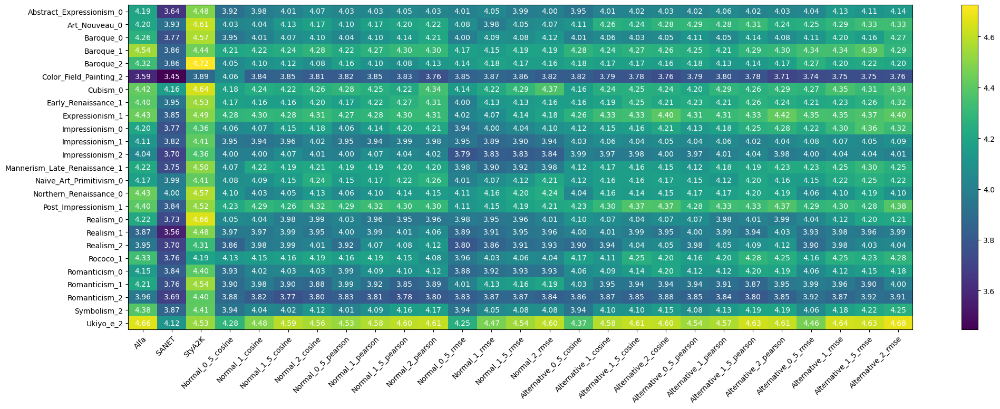

In [17]:
from statistics import mean

methods_scores_by_style_means = {method: {style: mean(scores) if scores else "HERE IS A PROBLEM" for style, scores in styles_scores.items()} for method, styles_scores in methods_scores_by_style.items()}
methods_scores_by_style_means = pd.DataFrame(methods_scores_by_style_means)
methods_scores_by_style_means

row_labels = styles
col_labels = methods_imgname_scores.keys()

fig, ax = plt.subplots(figsize=(24, 8))
im = ax.imshow(methods_scores_by_style_means, cmap='viridis', aspect='auto')
ax.set_xticks(np.arange(len(col_labels)), labels=col_labels)
ax.set_yticks(np.arange(len(row_labels)), labels=row_labels)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

for i in range(len(row_labels)):
    for j in range(len(col_labels)):
        ax.text(j, i, f"{methods_scores_by_style_means.iloc[i, j]:.2f}", ha="center", va="center", color="white")
fig.colorbar(im)
plt.show()

In [9]:
from PIL import Image
from laion_functions import get_aesthetic_scores
import os
import pandas as pd

def folder_scores(img_path, output_file):
    filenames = sorted(os.listdir(img_path))
    images = [Image.open(os.path.join(img_path, f)) for f in filenames]
    scores = get_aesthetic_scores(images)
    
    df = pd.DataFrame({
        "Image": filenames,
        "Aesthetic Score": scores
    })
    df.to_excel(output_file, index=False)
    print(f"Saved: {output_file}")

folder_scores("content", "content_scores.xlsx")
folder_scores("style", "style_scores.xlsx")


Saved: content_scores.xlsx
Saved: style_scores.xlsx


# Visual Assessment

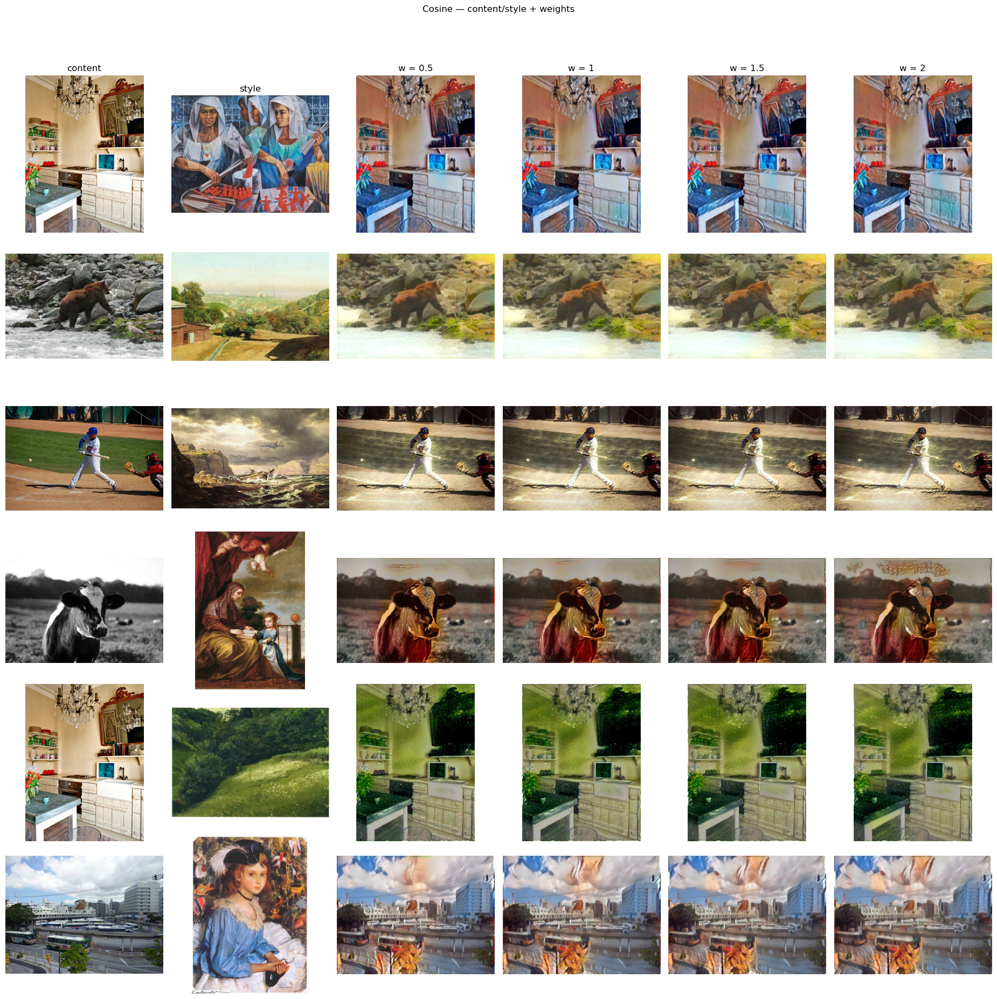

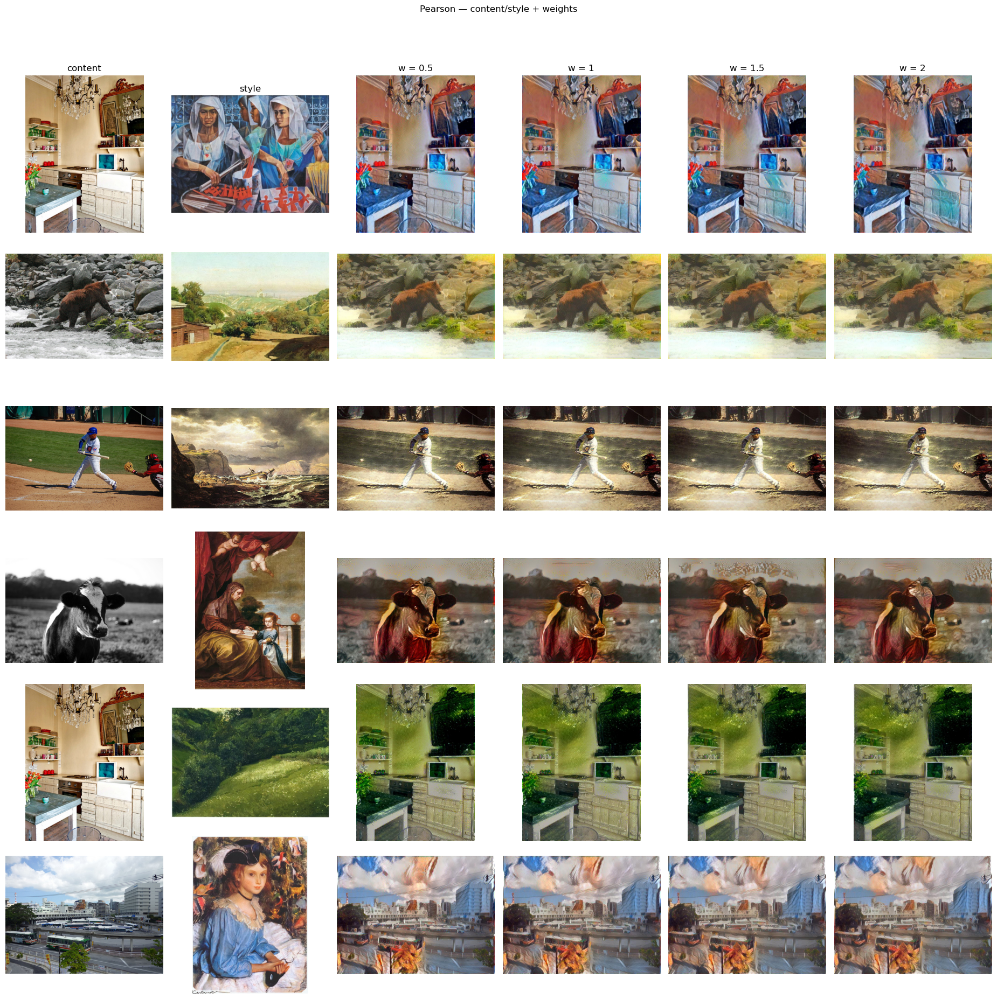

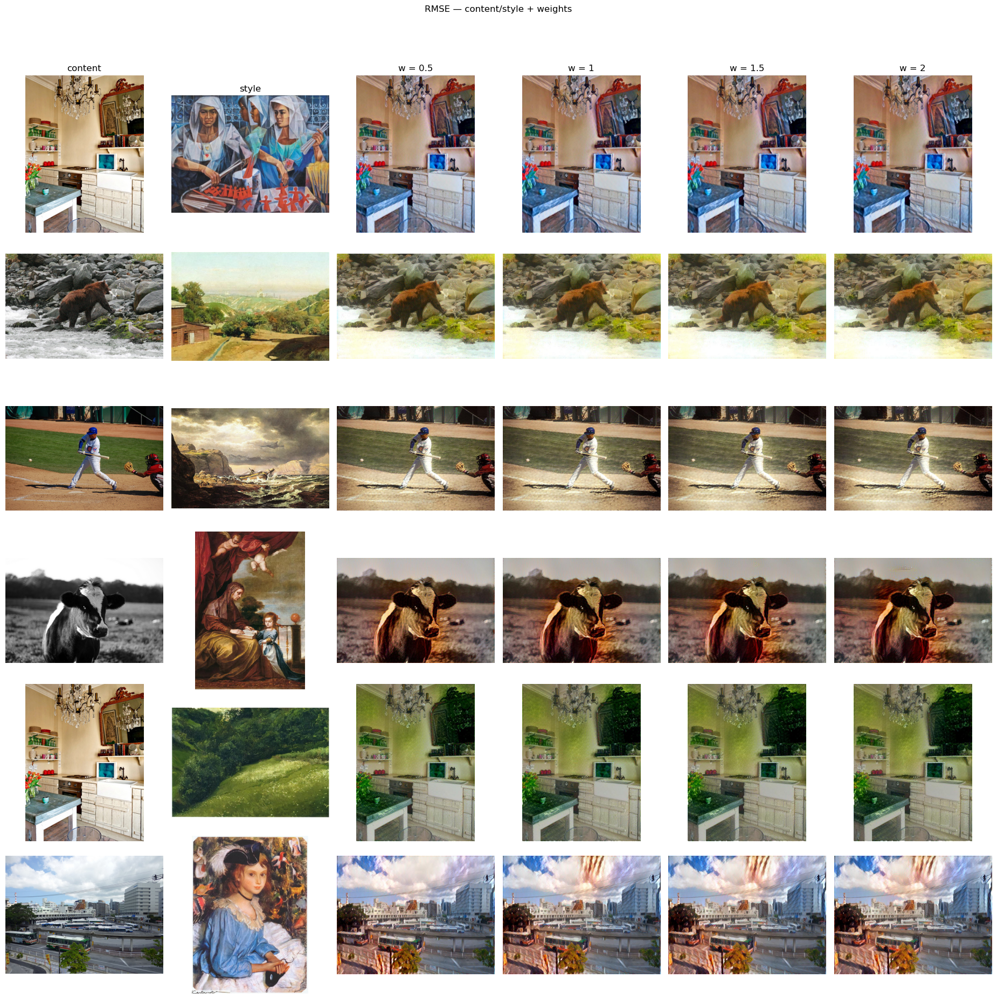

In [22]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

root = Path("/home/antonello03/workspace/workspace/AI/ProjectWork/gramstyle-thesis/style_loss_exp")
subset_root = root / "output/subset"
content_dir = root / "content"
style_dir   = root / "style"

weights = ["0.5", "1", "1.5", "2"]
metrics = [("cos","Cosine"), ("prs","Pearson"), ("rmse","RMSE")]
rows = 6  # rows to display (same across all metrics)

def parse_name(fname: str):
    # "Style_Prefix_content_metric.jpg" -> ("Style_Prefix_... .jpg", "content", "metric")
    stem = Path(fname).stem
    base, metric = stem.rsplit("_", 1)
    content = base.split("_")[-1]
    style = base[:-(len(content)+1)] + ".jpg"
    return style, content, metric

def open_img(p: Path):
    return Image.open(p).convert("RGB")

first_dir = subset_root / weights[0]

# --- choose SAME base set from COS and reuse for all metrics ---
cos_files = sorted(f.name for f in first_dir.glob("*_cos.jpg"))
if not cos_files:
    raise RuntimeError("No *_cos.jpg files found in subset.")
base_sample = random.sample(cos_files, min(rows, len(cos_files)))
base_names = ["_".join(Path(f).stem.split("_")[:-1]) for f in base_sample]  # drop metric suffix

for metric, nice in metrics:
    names = [f"{bn}_{metric}.jpg" for bn in base_names]

    cols = 2 + len(weights)  # content | style | weights
    fig, axes = plt.subplots(len(names), cols, figsize=(3.1*cols, 3.1*len(names)))
    if len(names) == 1:
        axes = [axes]

    fig.suptitle(f"{nice} — content/style + weights", y=0.995)

    for r, fname in enumerate(names):
        style_name, content_name, _ = parse_name(fname)

        content_path = content_dir / f"{content_name}.jpg"
        style_path   = style_dir / style_name

        axes[r][0].imshow(open_img(content_path))
        axes[r][0].axis("off")
        if r == 0: axes[r][0].set_title("content")

        axes[r][1].imshow(open_img(style_path))
        axes[r][1].axis("off")
        if r == 0: axes[r][1].set_title("style")

        for c, w in enumerate(weights, start=2):
            img_path = subset_root / w / fname
            axes[r][c].imshow(open_img(img_path))
            axes[r][c].axis("off")
            if r == 0:
                axes[r][c].set_title(f"w = {w}")

        # row label
        axes[r][0].set_ylabel(f"{content_name}  |  {Path(style_name).stem}  [{nice}]",
                              rotation=0, ha="right", va="center", labelpad=25)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
